In [4]:
%load_ext autoreload
%autoreload
from data import *
from audio_diffusion import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
from datasets import load_dataset, Dataset, DatasetDict

In [6]:
def show(X):
    plt.figure(figsize=(30,5),dpi=150)
    plt.imshow(tf.transpose(X),origin='lower',cmap='RdBu',aspect=1)
    plt.colorbar()
    σ = tf.math.reduce_std(X)
    plt.clim((-3*σ,3*σ))
    plt.ylim((0,85))

In [7]:
img_list = []
text_list = []
audio_ds = main('./music_data', num_proc=4, limit=4)

Found cached dataset csv (/home/server/.cache/huggingface/datasets/google___csv/google--MusicCaps-bedc2a0fd7888f2f/0.0.0/6954658bab30a358235fa864b05cf819af0e179325c740e4bc853bcc7ec513e1)
Loading cached processed dataset at /home/server/.cache/huggingface/datasets/google___csv/google--MusicCaps-bedc2a0fd7888f2f/0.0.0/6954658bab30a358235fa864b05cf819af0e179325c740e4bc853bcc7ec513e1/cache-272855fc65fc20d2_*_of_00004.arrow


Limiting to 4 examples


The low quality recording features a ballad song that contains sustained strings, mellow piano melody and soft female vocal singing over it. It sounds sad and soulful, like something you would hear at Sunday services.


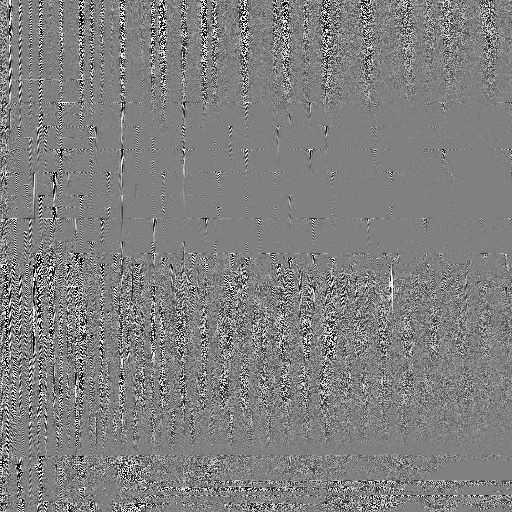

This song features an electric guitar as the main instrument. The guitar plays a descending run in the beginning then plays an arpeggiated chord followed by a double stop hammer on to a higher note and a descending slide followed by a descending chord run. The percussion plays a simple beat using rim shots. The percussion plays in common time. The bass plays only one note on the first count of each bar. The piano plays backing chords. There are no voices in this song. The mood of this song is relaxing. This song can be played in a coffee shop.


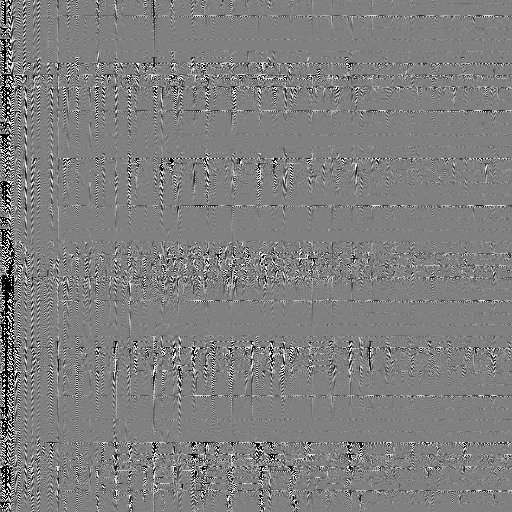

a male voice is singing a melody with changing tempos while snipping his fingers rhythmically. The recording sounds like it has been recorded in an empty room. This song may be playing, practicing snipping and singing along.


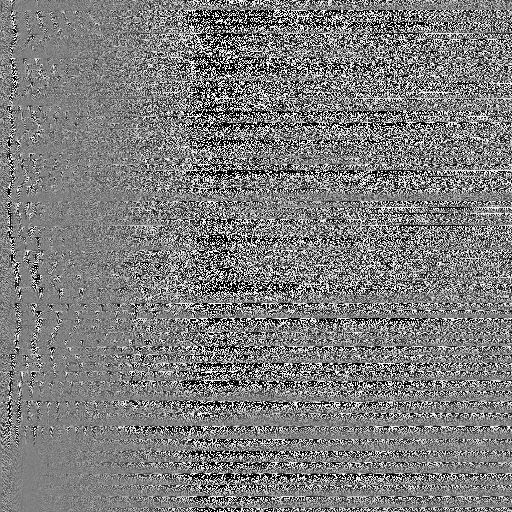

This song contains digital drums playing a simple groove along with two guitars. One strumming chords along with the snare the other one playing a melody on top. An e-bass is playing the footnote while a piano is playing a major and minor chord progression. A trumpet is playing a loud melody alongside the guitar. All the instruments sound flat and are being played by a keyboard. There are little bongo hits in the background panned to the left side of the speakers. Apart from the music you can hear eating sounds and a stomach rumbling. This song may be playing for an advertisement.


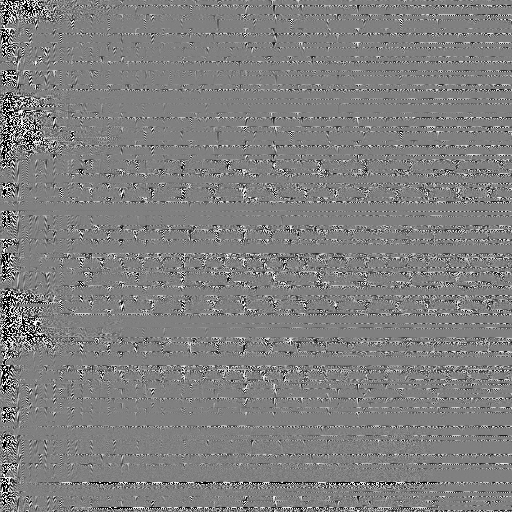

In [10]:
for i_clip in range(4):
    try:
        x = wav_to_tf(audio_ds[i_clip]['audio']['path'])
        X = mdct(x,3732)[:,0:512]
        img = mdct_to_img(X)
        Xr = img_to_mdct(img)
        z = tf.zeros((512,1354))
        Xr = tf.concat([Xr,z],axis=1)
        
        text_list.append(audio_ds[i_clip]['caption'])
        img_list.append(img)
        
        print(audio_ds[i_clip]['caption'])
        play(imdct(Xr),44100)
        display(img)

    except:
        print('error with ', i_clip, '. Wrong size?')

In [11]:
train_ds = Dataset.from_dict({"image": img_list, "text": text_list})
img_ds = DatasetDict({"train":train_ds})
img_ds.save_to_disk('new_ds')
img_ds.push_to_hub("danjacobellis/test", private=True)

Saving the dataset (0/1 shards):   0%|          | 0/8 [00:00<?, ? examples/s]

Pushing split train to the Hub.


Map:   0%|          | 0/8 [00:00<?, ? examples/s]

Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Upload 1 LFS files:   0%|          | 0/1 [00:00<?, ?it/s]